# Classification and detection of cars in Drone images

We start by installing and importing the necessary libraries:

In [ ]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 46.2 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import rasterio
import numpy as np
from matplotlib import pyplot as plt
import cv2
from shapely.geometry import shape
import geopandas as gpd
import shapely
from rasterio.plot import show
from sklearn.model_selection import train_test_split
import pandas as pd

We define the image path and import it, converting it into a numpy array, to then plot:

In [ ]:
path = 'drive/My Drive/Datasets/Car_detection/L1_car_detect.tif'

In [ ]:
src = rasterio.open(path)
im = src.read()

In [ ]:
im = im.transpose([1,2,0])

In [ ]:
im.shape

(12715, 12104, 4)

In [ ]:
im = im.astype('uint8')

(-0.5, 12103.5, 12714.5, -0.5)

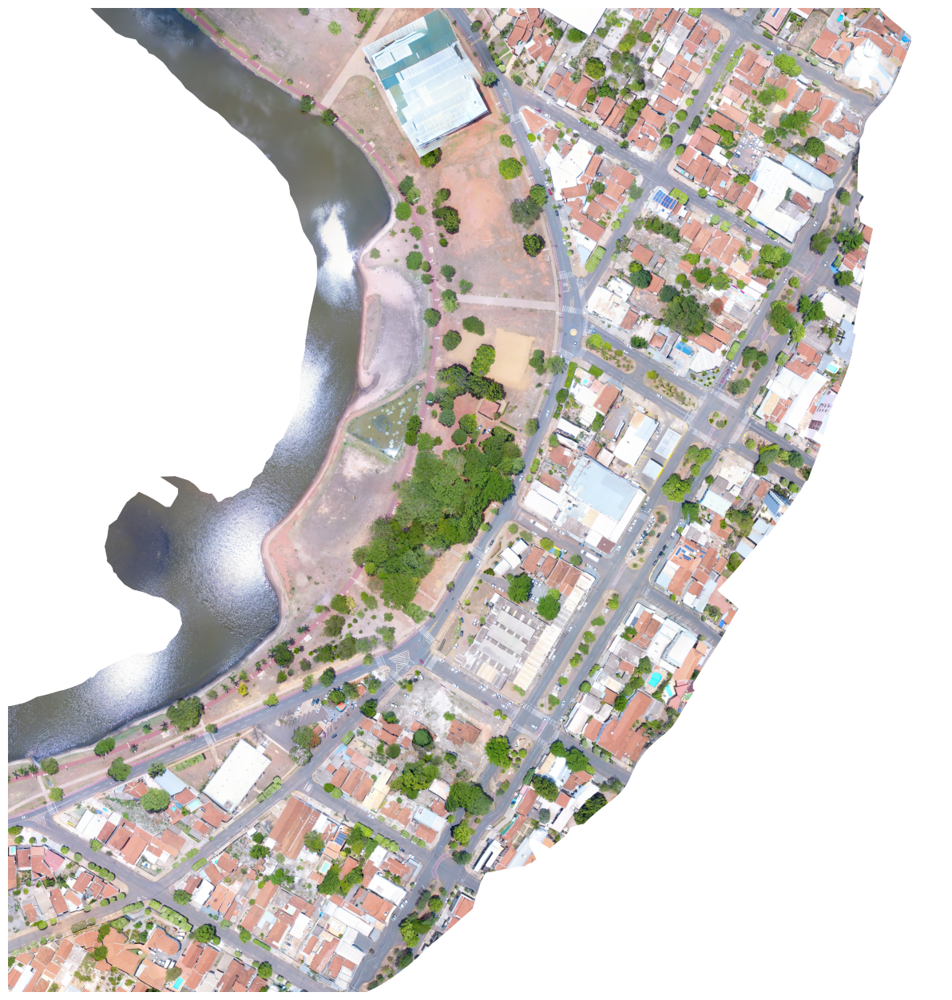

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(im)
plt.axis('off')

Let's now import our reference data. The Drone image was opened in Qgis and two shapefiles were created. One with car location points to create the positive samples and the other with location points of other objects in the image to create the negative samples. Let's import these two files and plot the points on the image. In red the cars and in blue non-cars.

In [ ]:
Cars = gpd.read_file('drive/My Drive/Datasets/Car_detection/Cars.shp')
No_Cars = gpd.read_file('drive/My Drive/Datasets/Car_detection/No_Cars.shp')

<Axes: >

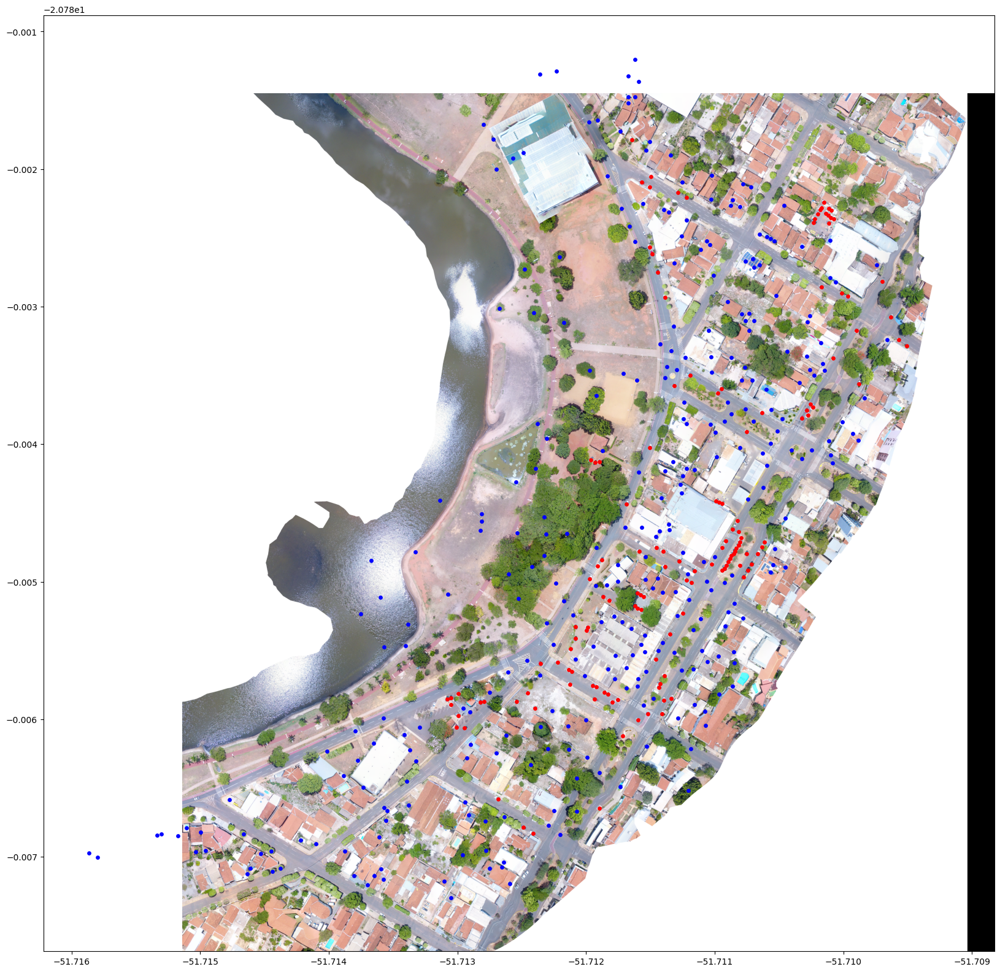

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))
show((src), ax=ax)
Cars.plot(ax=ax,  marker='o', color='red', markersize=15)
No_Cars.plot(ax=ax,  marker='o', color='blue', markersize=15)

The next step is to extract images from each point. Using rasterio and numpy, we will create a 40-pixel buffer around each point and cut it, making the resulting image 80x80x3 in size. We will also apply some data augmentation operations like rotation and flips.

In [ ]:
Car_img_list = []
for car_point in Cars['geometry']:
  x = car_point.xy[0][0]
  y = car_point.xy[1][0]
  row, col = src.index(x,y)
  img_path = im[row-40:row+40,col-40:col+40,0:3]
  flipVertical  = cv2.flip(img_path, 0)
  flipHorizontal  = cv2.flip(img_path, 1)
  flipBoth = cv2.flip(img_path, -1)
  image90 = cv2.rotate(img_path, cv2.ROTATE_90_CLOCKWISE)
  rows,cols,_ = img_path.shape
  M = cv2.getRotationMatrix2D(((cols-1)/2.0,(rows-1)/2.0),45,1)
  dst = cv2.warpAffine(img_path,M,(cols,rows))

  Car_img_list.append(img_path)
  Car_img_list.append(flipVertical)
  Car_img_list.append(flipHorizontal)
  Car_img_list.append(flipBoth)
  Car_img_list.append(image90)
  Car_img_list.append(dst)

Car_img_list = np.array(Car_img_list)

In [ ]:
No_Car_img_list = []
for No_car_point in No_Cars['geometry']:
  x = No_car_point.xy[0][0]
  y = No_car_point.xy[1][0]
  row, col = src.index(x,y)
  img_path = im[row-40:row+40,col-40:col+40,0:3]
  flipVertical  = cv2.flip(img_path, 0)
  flipHorizontal  = cv2.flip(img_path, 1)
  flipBoth = cv2.flip(img_path, -1)
  image90 = cv2.rotate(img_path, cv2.ROTATE_90_CLOCKWISE)
  rows,cols,_ = img_path.shape
  M = cv2.getRotationMatrix2D(((cols-1)/2.0,(rows-1)/2.0),45,1)
  dst = cv2.warpAffine(img_path,M,(cols,rows))

  No_Car_img_list.append(img_path)
  No_Car_img_list.append(flipVertical)
  No_Car_img_list.append(flipHorizontal)
  No_Car_img_list.append(flipBoth)
  No_Car_img_list.append(image90)
  No_Car_img_list.append(dst)

No_Car_img_list = np.array(No_Car_img_list)

In [ ]:
Car_img_list.shape

(852, 80, 80, 3)

Let's plot an example of a car image and a non-car image:

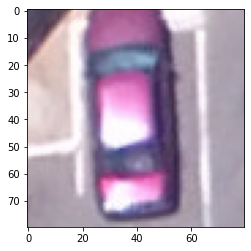

In [ ]:
plt.figure(figsize=[4,4])
plt.imshow(Car_img_list[6])

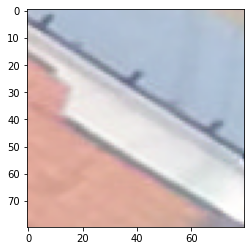

In [ ]:
plt.figure(figsize=[4,4])
plt.imshow(No_Car_img_list[0])

We can now create reference Y vectors with values of 0 for non-car and 1 for car. Then we normalize the values of the image dataset to the range of 0 to 1.

In [ ]:
Y_car = np.ones(len(Car_img_list))
Y_No_car = np.zeros(len(No_Car_img_list))

In [ ]:
X_car = np.array(Car_img_list)
X_No_car = np.array(No_Car_img_list)

In [ ]:
X = np.concatenate((X_car,X_No_car), axis=0)
Y = np.concatenate((Y_car,Y_No_car), axis=0)

In [ ]:
X = X/255

The next step is to divide the data into training and testing.

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.3, random_state = 42)

And then the creation of the custom convolutional network for image classification:

In [ ]:
from keras.models import Model, Sequential
from keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, Activation
#from tensorflow.keras.optimizers import Adam
from keras.optimizers import Adam
from keras.activations import relu
from keras.losses import binary_crossentropy
from keras import backend as K
import tensorflow as tf
from keras.models import load_model

In [ ]:
Model = Sequential()
Model.add(Conv2D(32,(3,3), kernel_initializer="he_normal", padding='same', input_shape=(x_train.shape[1:])))
Model.add(Activation('relu'))
Model.add(MaxPooling2D(pool_size=(2,2),strides=2))
Model.add(BatchNormalization())
Model.add(Dropout(0.25))
Model.add(Conv2D(64,(3,3), kernel_initializer="he_normal", padding='same'))
Model.add(Activation('relu'))
Model.add(MaxPooling2D(pool_size=(2,2),strides=2))
Model.add(BatchNormalization())
Model.add(Dropout(0.25))
Model.add(Conv2D(128,(3,3), kernel_initializer="he_normal", padding='same'))
Model.add(Activation('relu'))
Model.add(MaxPooling2D(pool_size=(2,2),strides=2))
Model.add(Flatten())
Model.add(Dense(128))
Model.add(Activation('relu'))
Model.add(Dropout(0.25))
Model.add(Dense(32))
Model.add(Activation('relu'))
Model.add(Dense(1))
Model.add(Activation('sigmoid'))
Model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.00001), metrics=['accuracy'])
Model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 80, 80, 32)        896       
                                                                 
 activation_6 (Activation)   (None, 80, 80, 32)        0         
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 batch_normalization_2 (Batc  (None, 40, 40, 32)       128       
 hNormalization)                                                 
                                                                 
 dropout_3 (Dropout)         (None, 40, 40, 32)        0         
                                                                 
 conv2d_4 (Conv2D)           (None, 40, 40, 64)       

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
history = Model.fit(x = x_train, y= y_train, batch_size=64, epochs=200, verbose=1, shuffle=True, validation_split=0.2)

Epoch 1/200
25/25 [==============================] - 1s 30ms/step - loss: 0.5920 - accuracy: 0.7151 - val_loss: 0.6846 - val_accuracy: 0.5882
Epoch 2/200
25/25 [==============================] - 1s 20ms/step - loss: 0.4541 - accuracy: 0.7926 - val_loss: 0.6622 - val_accuracy: 0.6113
Epoch 3/200
25/25 [==============================] - 1s 20ms/step - loss: 0.3972 - accuracy: 0.8175 - val_loss: 0.5847 - val_accuracy: 0.7954
Epoch 4/200
25/25 [==============================] - 1s 20ms/step - loss: 0.3518 - accuracy: 0.8406 - val_loss: 0.5416 - val_accuracy: 0.8312
Epoch 5/200
25/25 [==============================] - 1s 20ms/step - loss: 0.3271 - accuracy: 0.8502 - val_loss: 0.5232 - val_accuracy: 0.8261
Epoch 6/200
25/25 [==============================] - 1s 25ms/step - loss: 0.3069 - accuracy: 0.8758 - val_loss: 0.4722 - val_accuracy: 0.8593
Epoch 7/200
25/25 [==============================] - 1s 20ms/step - loss: 0.2779 - accuracy: 0.8835 - val_loss: 0.3842 - val_accuracy: 0.9003
Epoch 

After 200 training epochs, we will plot the accuracy and loss curves:

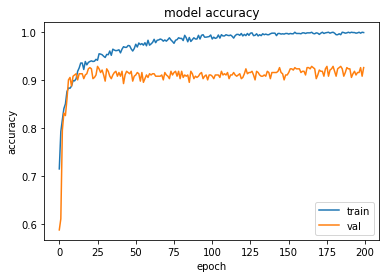

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='lower right')
plt.show()

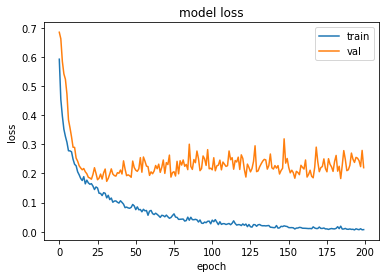

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

We can save both the architecture and the trained weights for later use.

In [ ]:
model_json = Model.to_json()
with open("drive/My Drive/Datasets/Car_detection/Model200_new.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
Model.save_weights("drive/My Drive/Datasets/Car_detection/Model200_weights_new.weights.h5")

In [ ]:
from keras.models import model_from_json

In [ ]:
json_file = open('drive/My Drive/Datasets/Car_detection/Model200_new.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("drive/My Drive/Datasets/Car_detection/Model200_weights_new.weights.h5")

Now let's apply our model to an entire image. To make this possible, we will create functions to cycle through and divide the image into sizes equal to the one we trained and also resize the image.

In [ ]:
def resize(image, width=None, height=None, inter=cv2.INTER_AREA):
	dim = None
	(h, w) = image.shape[:2]
	if width is None and height is None:
		return image
	if width is None:
		r = height / float(h)
		dim = (int(w * r), height)
	else:
		r = width / float(w)
		dim = (width, int(h * r))
	resized = cv2.resize(image, dim, interpolation=inter)
	return resized

In [ ]:
def pyramid(image, scale=1.5, minSize=(30, 30)):
	yield image
	while True:
		w = int(image.shape[1] / scale)
		image = resize(image, width=w)
		if image.shape[0] < minSize[1] or image.shape[1] < minSize[0]:
			break
		yield image

def sliding_window(image, stepSize, windowSize):
	for y in range(0, image.shape[0], stepSize):
		for x in range(0, image.shape[1], stepSize):
			yield (x, y, image[y:y + windowSize[1], x:x + windowSize[0]])

We can import our test image:

In [ ]:
test_path = 'drive/My Drive/Datasets/Car_detection/Example_cars_detect.tif'

In [ ]:
src_test = rasterio.open(test_path)
im_test = src_test.read()

In [ ]:
im_test = im_test.transpose([1,2,0])

In [ ]:
im_test = im_test.astype('uint8')

In [ ]:
image = im_test[:,:,0:3]

Let's set the parameters and apply the sliding window to our image. If the model detects cars in the window, the boundary of that window will be added to the list of bboxes:

In [ ]:
scale = 1
minSize = (4000, 4000)
# Sliding window parameters
stepSize = 20
(winW, winH) = (80, 80)

In [ ]:
bboxes = np.zeros(4,np.int64)
for i, resized in enumerate(pyramid(image, scale=scale, minSize=minSize)):
  for (x, y, window) in sliding_window(resized, stepSize=stepSize, windowSize=(winW, winH)):
    if (window.shape[0] == winH and window.shape[1] == winW):
      clone = resized.copy()
      cropped_img = resized[y:y + winH, x:x + winW]
      cropped_img = cropped_img[np.newaxis,:,:,:]
      cropped_img = cropped_img/255
      predict = loaded_model.predict(cropped_img)
      predict = np.round(predict).astype(np.uint8)
      y_pred = predict[0][0]


      if y_pred == 1:
        print('detected')
        if i != 0:
          bboxes = np.vstack((bboxes, np.array([
            int(x*scale*i), int(y*scale*i),
            int((x + winW)*scale*i), int((y + winH)*scale*i)])))
        else:
          bboxes = np.vstack((bboxes, np.array([
            int(x),int(y),int(x + winW), int(y + winH)])))




detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected


Let's plot the results:

In [ ]:
bboxes = np.delete(bboxes, (0), axis=0)

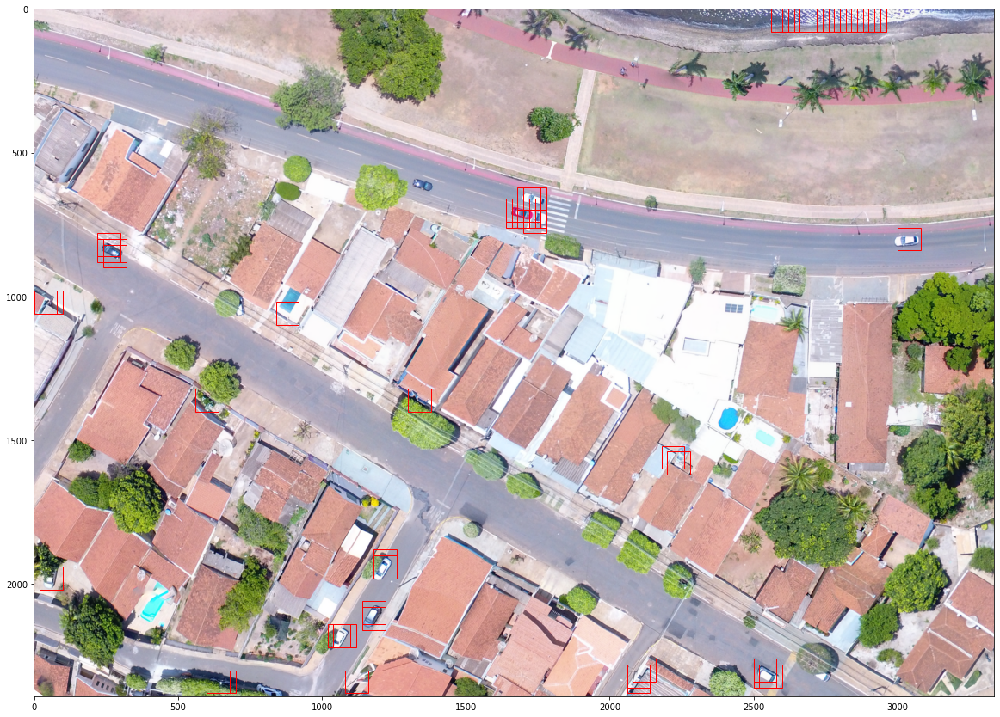

In [ ]:
plt.figure(figsize=[20,20])
plt.imshow(im_test)
for box in bboxes:
  rect = plt.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], edgecolor='r', facecolor='none')
  plt.gca().add_patch(rect)

We saw that we have regions with several bboxes close to each other. Let's use non-maximum suppression to remove inaccurate detections from the same region:

In [ ]:
def non_max_suppression_fast(boxes, overlapThresh):
	'''
	This function performs non maximal supression over a set of bounding boxes
	where the resulting boxes contain most of the information of the initial
	boxes.
	Args:
		boxes(numpy.array): Set of bounding boxes of shape=(None,4).
		overlapThresh(float): Supression threshold for the overlapped area
		between boxes.
	Returns:
		boxes(numpy.array): Resulting boxes after performing the NMS of
		shape=(None,4).
	'''

	if len(boxes) == 0:
		return []

	if boxes.dtype.kind == "i":
		boxes = boxes.astype("float")


	pick = []


	x1 = boxes[:,0]
	y1 = boxes[:,1]
	x2 = boxes[:,2]
	y2 = boxes[:,3]

	area = (x2 - x1 + 1) * (y2 - y1 + 1)
	idxs = np.argsort(y2)

	while len(idxs) > 0:
		last = len(idxs) - 1
		i = idxs[last]
		pick.append(i)

		xx1 = np.maximum(x1[i], x1[idxs[:last]])
		yy1 = np.maximum(y1[i], y1[idxs[:last]])
		xx2 = np.minimum(x2[i], x2[idxs[:last]])
		yy2 = np.minimum(y2[i], y2[idxs[:last]])

		# compute the width and height of the bounding box
		w = np.maximum(0, xx2 - xx1 + 1)
		h = np.maximum(0, yy2 - yy1 + 1)

		overlap = (w * h) / area[idxs[:last]]

		idxs = np.delete(idxs, np.concatenate(([last],
			np.where(overlap > overlapThresh)[0])))

	return boxes[pick].astype("int")

In [ ]:
nms_bboxes = non_max_suppression_fast(bboxes, 0.3)

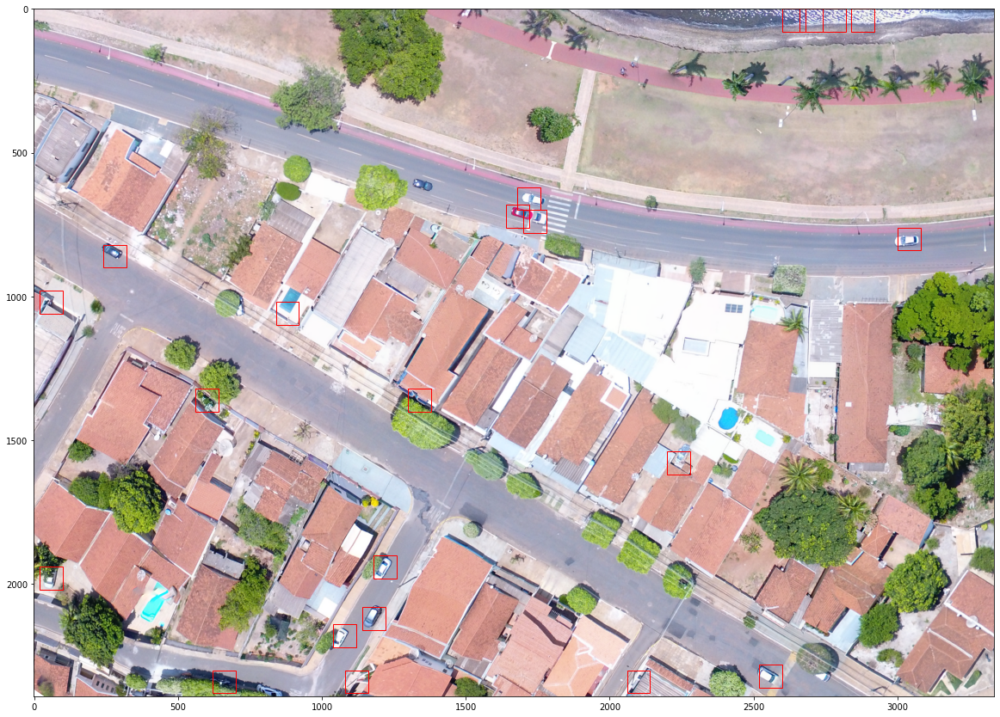

In [ ]:
plt.figure(figsize=[20,20])
plt.imshow(im_test)
for box in nms_bboxes:
  rect = plt.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], edgecolor='r', facecolor='none')
  plt.gca().add_patch(rect)

For each detection found, we will obtain the centroid and convert it to latitude and longitude values:

In [ ]:
ls_x = []
ls_y = []
for i in nms_bboxes:
  xcenter = (i[2] - i[0])/2 + i[0]
  ycenter = (i[3] - i[1])/2 + i[1]
  xcenter = np.round(xcenter)
  ycenter = np.round(ycenter)
  xs, ys = rasterio.transform.xy(src_test.transform, ycenter, xcenter)
  ls_x.append(xs)
  ls_y.append(ys)

In [ ]:
df_xy = pd.DataFrame([])
df_xy['x'] = ls_x
df_xy['y'] = ls_y

Finally, we create a geodataframe of points:

In [ ]:
gdf = gpd.GeoDataFrame(df_xy, geometry=gpd.points_from_xy(df_xy['x'], df_xy['y']))

In [ ]:
gdf = gdf.set_crs(src_test.crs.to_dict()['init'])

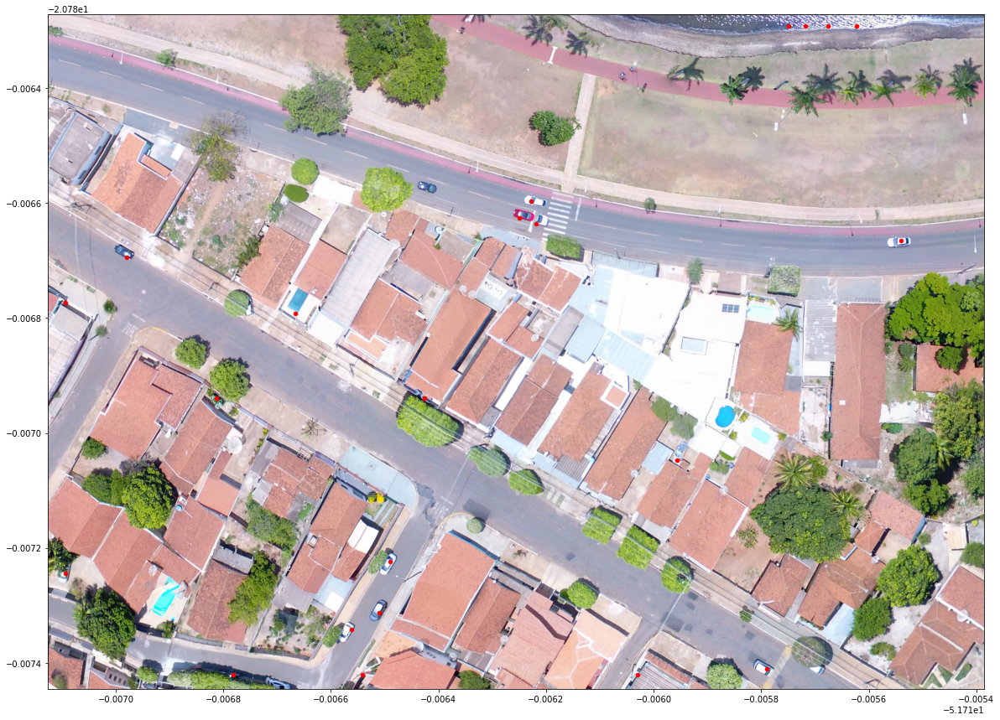

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))
show((src_test,[1,2,3]), ax=ax)
gdf.plot(ax=ax,  marker='o', color='red', markersize=15)

We save it in a .json file and download:

In [ ]:
gdf.to_file('/content/cars_locations.json', driver="GeoJSON")

In [ ]:
from google.colab import files
files.download('/content/cars_locations.json')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>